In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression 

In [2]:
pd.set_option('display.max_columns', None)

# Data Cleaning
## Correct some game scores
## Remove all-star games and games that are not counted towards their records

In [3]:
prefix = "../data/"
team_stats_recent = pd.read_csv(prefix + 'raw/TeamStatisticsFrom2010.csv', dtype={'gameLabel': str, 'gameSubLabel': str})

In [4]:
team_stats_recent

,gameId,gameDateTimeEst,gameType,gameLabel,gameSubLabel,seriesGameNumber,teamId,teamCity,teamName,opponentTeamId,opponentTeamCity,opponentTeamName,home,win,teamScore,opponentScore,seed,numMinutes,assists,steals,blocks,blocksAgainst,fieldGoalsMade,fieldGoalsAttempted,fieldGoalsPercentage,threePointersMade,threePointersAttempted,threePointersPercentage,freeThrowsMade,freeThrowsAttempted,freeThrowsPercentage,reboundsOffensive,reboundsDefensive,reboundsTotal,reboundsTeam,foulsPersonal,personalFoulsDrawn,turnovers,turnoversTeam,plusMinusPoints,q1Points,q2Points,q3Points,q4Points,ot1Points,ot2Points,otAllPoints,benchPoints,biggestLead,biggestScoringRun,leadChanges,pointsFastBreak,pointsFromTurnovers,pointsInThePaint,pointsSecondChance,timesTied,timeoutsRemaining,seasonWins,seasonLosses,estimatedOffensiveRating,offensiveRating,estimatedDefensiveRating,defensiveRating,estimatedNetRating,netRating,assistPercentage,assistToTurnoverRatio,assistRatio,offensiveReboundPercentage,defensiveReboundPercentage,reboundPercentage,teamTurnoverPercentage,effectiveFieldGoalPercentage,trueShootingPercentage,estimatedPace,pace,pacePer40,possessions,playerImpactEstimate,pointsOffTurnovers,opponentPointsOffTurnovers,opponentPointsSecondChance,opponentPointsFastBreak,opponentPointsInPaint,percentFieldGoalAttempts2Point,percentFieldGoalAttempts3Point,percentPoints2Point,percentPoints2PointMidRange,percentPoints3Point,percentPointsFastBreak,percentPointsFreeThrow,percentPointsOffTurnovers,percentPointsInPaint,percentAssisted2PointMade,percentUnassisted2PointMade,percentAssisted3PointMade,percentUnassisted3PointMade,percentAssistedFieldGoalsMade,percentUnassistedFieldGoalsMade,freeThrowAttemptRate,opponentEffectiveFieldGoalPercentage,opponentFreeThrowAttemptRate,opponentTurnoverPercentage,opponentOffensiveReboundPercentage,gameDate,season
0,42500405,2026-06-13 20:30:00,Playoffs,NBA Finals,Game 5,5.0,1610612759,San Antonio,Spurs,1610612752,New York,Knicks,1,0,90,94,2.0,240.0,18,6,7,4,33,86,0.384,12,37,0.324,12,19,0.632,14,33,47,12.0,22,21,12,1.0,-4.0,23.0,19.0,30.0,18.0,NaN,NaN,NaN,32.0,16.0,9.0,5.0,13.0,21.0,38.0,17.0,5.0,0.0,1.0,4.0,96.4,100.0,93.7,103.3,2.7,-3.3,0.545,1.38,14.2,0.339,0.593,0.470,0.144,0.453,0.477,96.8,90.5,75.42,90,0.508,21.0,18.0,14.0,13.0,30.0,0.570,0.430,0.467,0.044,0.400,0.144,0.133,0.233,0.422,0.381,0.619,0.833,0.167,0.545,0.455,0.221,0.425,0.322,0.154,0.407,2026-06-13,2025
1,42500405,2026-06-13 20:30:00,Playoffs,NBA Finals,Game 5,5.0,1610612752,New York,Knicks,1610612759,San Antonio,Spurs,0,1,94,90,3.0,240.0,14,8,4,7,31,87,0.356,12,37,0.324,20,28,0.714,13,35,48,18.0,21,22,10,4.0,4.0,13.0,24.0,28.0,29.0,NaN,NaN,NaN,9.0,4.0,10.0,5.0,13.0,18.0,30.0,14.0,5.0,0.0,4.0,1.0,93.7,103.3,96.4,100.0,-2.7,3.3,0.452,1.00,10.9,0.407,0.661,0.530,0.154,0.425,0.473,96.8,90.5,75.42,91,0.492,18.0,21.0,17.0,13.0,38.0,0.575,0.425,0.404,0.085,0.383,0.138,0.213,0.191,0.319,0.263,0.737,0.750,0.250,0.452,0.548,0.322,0.453,0.221,0.144,0.339,2026-06-13,2025
2,42500404,2026-06-10 20:30:00,Playoffs,NBA Finals,Game 4,4.0,1610612759,San Antonio,Spurs,1610612752,New York,Knicks,0,0,106,107,2.0,240.0,24,10,4,4,36,86,0.419,17,43,0.395,17,20,0.850,12,30,42,8.0,21,21,11,1.0,-1.0,41.0,35.0,14.0,16.0,NaN,NaN,NaN,28.0,29.0,10.0,3.0,12.0,25.0,28.0,10.0,2.0,0.0,1.0,3.0,111.8,112.8,109.9,115.1,1.9,-2.3,0.667,2.00,17.9,0.308,0.717,0.500,0.128,0.517,0.559,96.1,93.5,77.92,94,0.514,25.0,11.0,14.0,13.0,34.0,0.500,0.500,0.358,0.094,0.481,0.113,0.160,0.236,0.264,0.421,0.579,0.941,0.059,0.667,0.333,0.233,0.558,0.359,0.161,0.283,2026-06-10,2025
3,42500404,2026-06-10 20:30:00,Playoffs,NBA Finals,Game 4,4.0,1610612752,New York,Knicks,1610612759,San Antonio,Spurs,1,1,107,106,3.0,240.0,23,6,4,4,36,78,0.462,15,32,0.469,20,28,0.714,8,31,39,14.0,21,21,13,2.0,1.0,22.0,27.0,26.0,32.0,NaN,NaN,NaN,12.0,1.0,13.0,3.0,13.0,11.0,34.0,14.0,2.0,0.0,3.0,1.0,109.9,115.1,111.8,112.8,-1.9,2.3,0.639,1.53,17.8,0.283,0.692,0.500,0.161,0.558,0.592,96.1,93.5,77.92,93,0.486,11.0,25.0,10.0,12.0,28.0,0.590,0.410,

In [6]:
team_stats_recent['gameType'].value_counts(dropna=False)

gameType
Regular Season        35768
NaN                    5196
Playoffs               2504
Play-in Tournament       62
All-Star Game            14
Emirates NBA Cup          2
Name: count, dtype: int64

In [ ]:
season_dates = pd.read_csv(prefix + 'processed/nba_season_dates.csv', parse_dates=['season_start', 'season_end', 'playoffs_start', 'playoffs_end'])
season_dates['season_year'] = season_dates['season'].str[:4].astype(int)
season_dates

,season,season_start,season_end,num_games,playoffs_start,playoffs_end,notes,season_year
0,2010-11,2010-10-26,2011-04-13,82,2011-04-16,2011-06-12,NaN,2010
1,2011-12,2011-12-25,2012-04-26,66,2012-04-28,2012-06-21,Shortened — NBA lockout,2011
2,2012-13,2012-10-30,2013-04-17,82,2013-04-20,2013-06-20,NaN,2012
3,2013-14,2013-10-29,2014-04-16,82,2014-04-19,2014-06-15,NaN,2013
4,2014-15,2014-10-28,2015-04-15,82,2015-04-18,2015-06-16,NaN,2014
5,2015-16,2015-10-27,2016-04-13,82,2016-04-16,2016-06-19,NaN,2015
6,2016-17,2016-10-25,2017-04-12,82,2017-04-15,2017-06-12,NaN,2016
7,2017-18,2017-10-17,2018-04-11,82,2018-04-14,2018-06-08,NaN,2017
8,2018-19,2018-10-16,2019-04-10,82,2019-04-13,2019-06-13,NaN,2018
9,2019-20,2019-10-22,2020-08-14,71-75,2020-08-17,2020-10-11,COVID — suspended Mar 11; seeding games Jul 30...,2019


In [23]:
team_stats_recent['gameDate'] = pd.to_datetime(team_stats_recent['gameDate'])

In [24]:
team_stats_recent = team_stats_recent.merge(season_dates[['season_year', 'season_start', 'season_end', 'playoffs_start', 'playoffs_end']],
                    left_on='season', right_on='season_year', how='left')

team_stats_recent

,gameId,gameDateTimeEst,gameType,gameLabel,gameSubLabel,seriesGameNumber,teamId,teamCity,teamName,opponentTeamId,...,opponentFreeThrowAttemptRate,opponentTurnoverPercentage,opponentOffensiveReboundPercentage,gameDate,season,season_year,season_start,season_end,playoffs_start,playoffs_end
0,42500405,2026-06-13 20:30:00,Playoffs,NBA Finals,Game 5,5.0,1610612759,San Antonio,Spurs,1610612752,...,0.322,0.154,0.407,2026-06-13,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
1,42500405,2026-06-13 20:30:00,Playoffs,NBA Finals,Game 5,5.0,1610612752,New York,Knicks,1610612759,...,0.221,0.144,0.339,2026-06-13,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
2,42500404,2026-06-10 20:30:00,Playoffs,NBA Finals,Game 4,4.0,1610612759,San Antonio,Spurs,1610612752,...,0.359,0.161,0.283,2026-06-10,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
3,42500404,2026-06-10 20:30:00,Playoffs,NBA Finals,Game 4,4.0,1610612752,New York,Knicks,1610612759,...,0.233,0.128,0.308,2026-06-10,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
4,42500403,2026-06-08 20:30:00,Playoffs,NBA Finals,Game 3,3.0,1610612759,San Antonio,Spurs,1610612752,...,0.250,0.140,0.373,2026-06-08,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43541,11000004,2010-10-05 19:00:00,NaN,NaN,NaN,NaN,1610612739,Cleveland,Cavaliers,1610612766,...,0.354,0.173,0.262,2010-10-05,2010,2010,2010-10-26,2011-04-13,2011-04-16,2011-06-12
43542,11000007,2010-10-05 19:00:00,NaN,NaN,NaN,NaN,1610612751,New Jersey,Nets,1610612755,...,0.681,0.094,NaN,2010-10-05,2010,2010,2010-10-26,2011-04-13,2011-04-16,2011-06-12
43543,11000007,2010-10-05 19:00:00,NaN,NaN,NaN,NaN,1610612755,Philadelphia,76ers,1610612751,...,0.493,0.189,NaN,2010-10-05,2010,2010,2010-10-26,2011-04-13,2011-04-16,2011-06-12
43544,11000003,2010-10-04 15:00:00,NaN,NaN,NaN,NaN,1610612750,Minnesota,Timberwolves,1610612747,...,0.418,0.222,0.358,2010-10-04,2010,2010,2010-10-26,2011-04-13,2011-04-16,2011-06-12


In [25]:
team_stats_recent = team_stats_recent[
    (team_stats_recent['gameDate'] >= team_stats_recent['season_start']) &
    (team_stats_recent['gameDate'] <= team_stats_recent['playoffs_end'])
]

team_stats_recent

,gameId,gameDateTimeEst,gameType,gameLabel,gameSubLabel,seriesGameNumber,teamId,teamCity,teamName,opponentTeamId,...,opponentFreeThrowAttemptRate,opponentTurnoverPercentage,opponentOffensiveReboundPercentage,gameDate,season,season_year,season_start,season_end,playoffs_start,playoffs_end
0,42500405,2026-06-13 20:30:00,Playoffs,NBA Finals,Game 5,5.0,1610612759,San Antonio,Spurs,1610612752,...,0.322,0.154,0.407,2026-06-13,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
1,42500405,2026-06-13 20:30:00,Playoffs,NBA Finals,Game 5,5.0,1610612752,New York,Knicks,1610612759,...,0.221,0.144,0.339,2026-06-13,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
2,42500404,2026-06-10 20:30:00,Playoffs,NBA Finals,Game 4,4.0,1610612759,San Antonio,Spurs,1610612752,...,0.359,0.161,0.283,2026-06-10,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
3,42500404,2026-06-10 20:30:00,Playoffs,NBA Finals,Game 4,4.0,1610612752,New York,Knicks,1610612759,...,0.233,0.128,0.308,2026-06-10,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
4,42500403,2026-06-08 20:30:00,Playoffs,NBA Finals,Game 3,3.0,1610612759,San Antonio,Spurs,1610612752,...,0.250,0.140,0.373,2026-06-08,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43319,21000003,2010-10-26 22:30:00,Regular Season,NaN,NaN,NaN,1610612745,Houston,Rockets,1610612747,...,0.292,0.115,0.305,2010-10-26,2010,2010,2010-10-26,2011-04-13,2011-04-16,2011-06-12
43320,21000002,2010-10-26 22:00:00,Regular Season,NaN,NaN,NaN,1610612756,Phoenix,Suns,1610612757,...,0.161,0.167,0.490,2010-10-26,2010,2010,2010-10-26,2011-04-13,2011-04-16,2011-06-12
43321,21000002,2010-10-26 22:00:00,Regular Season,NaN,NaN,NaN,1610612757,Portland,Trail Blazers,1610612756,...,0.216,0.211,0.244,2010-10-26,2010,2010,2010-10-26,2011-04-13,2011-04-16,2011-06-12
43322,21000001,2010-10-26 19:30:00,Regular Season,NaN,NaN,NaN,1610612748,Miami,Heat,1610612738,...,0.362,0.217,0.268,2010-10-26,2010,2010,2010-10-26,2011-04-13,2011-04-16,2011-06-12


In [26]:
team_stats_recent['teamName'].value_counts(dropna=False)

teamName
Celtics          1473
Heat             1463
Warriors         1446
Thunder          1437
Spurs            1412
Pacers           1401
Nuggets          1398
Cavaliers        1396
Clippers         1394
Raptors          1379
Mavericks        1379
76ers            1378
Bucks            1378
Rockets          1376
Grizzlies        1375
Hawks            1374
Lakers           1363
Knicks           1358
Trail Blazers    1356
Suns             1336
Bulls            1336
Jazz             1334
Nets             1334
Timberwolves     1330
Wizards          1326
Magic            1323
Pistons          1298
Kings            1289
Hornets          1202
Pelicans         1076
Bobcats           316
Stars               3
Stripes             3
World               2
Team Melo           2
Team Vince          2
Team T-Mac          1
Team Austin         1
Name: count, dtype: int64

In [27]:
team_stats_recent['gameLabel'].value_counts(dropna=False)

gameLabel
NaN                        38040
West - First Round           582
East - First Round           554
Emirates NBA Cup             400
East - Conf. Semifinals      304
West - Conf. Semifinals      292
NBA Finals                   160
East - Conf. Finals          152
West - Conf. Finals          136
East First Round              94
West First Round              88
East Conf. Semifinals         44
West Conf. Semifinals         44
West Conf. Finals             24
SoFi Play-In Tournament       24
AWS NBA Rivals Week           22
East Conf. Finals             20
West Play-In                  18
East Play-In                  18
All-Star                       6
NBA Mexico City Game           6
Rising Stars Semifinal         4
NBA Paris Games                4
All-Star Championship          2
Rising Stars Final             2
NBA Pioneers Classic           2
NBA London Game                2
NBA Berlin Game                2
NBA Paris Game                 2
NBA Cup                        2


In [28]:
# Some of the games are not compectitive: the all-star weekend
exclude_labels = ['All-Star', 'All-Star Championship', 'Rising Stars Semifinal', 'Rising Stars Final',]

team_stats_recent = team_stats_recent[~team_stats_recent['gameLabel'].isin(exclude_labels)]

In [29]:
team_stats_recent['gameLabel'].value_counts(dropna=False)

gameLabel
NaN                        38040
West - First Round           582
East - First Round           554
Emirates NBA Cup             400
East - Conf. Semifinals      304
West - Conf. Semifinals      292
NBA Finals                   160
East - Conf. Finals          152
West - Conf. Finals          136
East First Round              94
West First Round              88
East Conf. Semifinals         44
West Conf. Semifinals         44
West Conf. Finals             24
SoFi Play-In Tournament       24
AWS NBA Rivals Week           22
East Conf. Finals             20
West Play-In                  18
East Play-In                  18
NBA Mexico City Game           6
NBA Paris Games                4
NBA Pioneers Classic           2
NBA London Game                2
NBA Berlin Game                2
NBA Paris Game                 2
NBA Cup                        2
Name: count, dtype: int64

In [30]:
# these are real NBA games and will be kept
international_labels = [
    'NBA Mexico City Game',
    'NBA Paris Games',
    'NBA Paris Game',
    'NBA London Game',
    'NBA Berlin Game',
    'NBA Pioneers Classic',
]

mask = team_stats_recent['gameLabel'].isin(international_labels)
team_stats_recent[mask]

,gameId,gameDateTimeEst,gameType,gameLabel,gameSubLabel,seriesGameNumber,teamId,teamCity,teamName,opponentTeamId,...,opponentFreeThrowAttemptRate,opponentTurnoverPercentage,opponentOffensiveReboundPercentage,gameDate,season,season_year,season_start,season_end,playoffs_start,playoffs_end
1196,22500702,2026-02-01 15:30:00,Regular Season,NBA Pioneers Classic,NaN,NaN,1610612738,Boston,Celtics,1610612749,...,0.183,0.126,0.291,2026-02-01,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
1197,22500702,2026-02-01 15:30:00,Regular Season,NBA Pioneers Classic,NaN,NaN,1610612749,Milwaukee,Bucks,1610612738,...,0.141,0.116,0.407,2026-02-01,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
1402,22500602,2026-01-18 12:00:00,Regular Season,NBA London Game,NaN,NaN,1610612763,Memphis,Grizzlies,1610612753,...,0.168,0.170,0.358,2026-01-18,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
1403,22500602,2026-01-18 12:00:00,Regular Season,NBA London Game,NaN,NaN,1610612753,Orlando,Magic,1610612763,...,0.275,0.118,0.319,2026-01-18,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
1450,22500578,2026-01-15 14:00:00,Regular Season,NBA Berlin Game,NaN,NaN,1610612753,Orlando,Magic,1610612763,...,0.253,0.158,0.224,2026-01-15,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
1451,22500578,2026-01-15 14:00:00,Regular Season,NBA Berlin Game,NaN,NaN,1610612763,Memphis,Grizzlies,1610612753,...,0.242,0.158,0.429,2026-01-15,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
2486,22500147,2025-11-01 22:00:00,Regular Season,NBA Mexico City Game,NaN,NaN,1610612742,Dallas,Mavericks,1610612765,...,0.374,0.079,0.278,2025-11-01,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
2487,22500147,2025-11-01 22:00:00,Regular Season,NBA Mexico City Game,NaN,NaN,1610612765,Detroit,Pistons,1610612742,...,0.388,0.147,0.245,2025-11-01,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
4114,22400633,2025-01-25 12:00:00,Regular Season,NBA Paris Games,NaN,NaN,1610612759,San Antonio,Spurs,1610612754,...,0.137,0.098,0.380,2025-01-25,2024,2024,2024-10-22,2025-04-13,2025-04-19,2025-06-22
4115,22400633,2025-01-25 12:00:00,Regular Season,NBA Paris Games,NaN,NaN,1610612754,Indiana,Pacers,1610612759,...,0.294,0.235,0.333,2025-01-25,2024,2024,2024-10-22,2025-04-13,2025-04-19,2025-06-22


In [32]:
team_stats_recent['teamName'].value_counts(dropna=False)

teamName
Celtics          1473
Heat             1463
Warriors         1446
Thunder          1437
Spurs            1412
Pacers           1401
Nuggets          1398
Cavaliers        1396
Clippers         1394
Raptors          1379
Mavericks        1379
76ers            1378
Bucks            1378
Rockets          1376
Grizzlies        1375
Hawks            1374
Lakers           1363
Knicks           1358
Trail Blazers    1356
Suns             1336
Bulls            1336
Jazz             1334
Nets             1334
Timberwolves     1330
Wizards          1326
Magic            1323
Pistons          1298
Kings            1289
Hornets          1202
Pelicans         1076
Bobcats           316
Name: count, dtype: int64

In [33]:
team_stats_recent.columns.to_list()

['gameId',
 'gameDateTimeEst',
 'gameType',
 'gameLabel',
 'gameSubLabel',
 'seriesGameNumber',
 'teamId',
 'teamCity',
 'teamName',
 'opponentTeamId',
 'opponentTeamCity',
 'opponentTeamName',
 'home',
 'win',
 'teamScore',
 'opponentScore',
 'seed',
 'numMinutes',
 'assists',
 'steals',
 'blocks',
 'blocksAgainst',
 'fieldGoalsMade',
 'fieldGoalsAttempted',
 'fieldGoalsPercentage',
 'threePointersMade',
 'threePointersAttempted',
 'threePointersPercentage',
 'freeThrowsMade',
 'freeThrowsAttempted',
 'freeThrowsPercentage',
 'reboundsOffensive',
 'reboundsDefensive',
 'reboundsTotal',
 'reboundsTeam',
 'foulsPersonal',
 'personalFoulsDrawn',
 'turnovers',
 'turnoversTeam',
 'plusMinusPoints',
 'q1Points',
 'q2Points',
 'q3Points',
 'q4Points',
 'ot1Points',
 'ot2Points',
 'otAllPoints',
 'benchPoints',
 'biggestLead',
 'biggestScoringRun',
 'leadChanges',
 'pointsFastBreak',
 'pointsFromTurnovers',
 'pointsInThePaint',
 'pointsSecondChance',
 'timesTied',
 'timeoutsRemaining',
 'seas

In [34]:
team_stats_recent['seasonWins'].value_counts(dropna=False)

seasonWins
NaN     2710
1.0     1667
2.0     1604
3.0     1433
4.0     1292
        ... 
69.0       2
73.0       1
72.0       1
71.0       1
70.0       1
Name: count, Length: 75, dtype: int64

In [35]:
team_stats_recent['seasonLosses'].value_counts(dropna=False)

seasonLosses
NaN     2710
1.0     1701
2.0     1569
3.0     1495
4.0     1306
        ... 
68.0       3
72.0       1
71.0       1
70.0       1
69.0       1
Name: count, Length: 74, dtype: int64

In [36]:
team_stats_recent['plusMinusPoints'].value_counts(dropna=False)

plusMinusPoints
-7.0     1274
 7.0     1274
-5.0     1251
 5.0     1251
 6.0     1243
         ... 
 73.0       1
-57.0       1
 57.0       1
-61.0       1
 61.0       1
Name: count, Length: 125, dtype: int64

In [37]:
team_stats_recent['blocks'].value_counts(dropna=False)

blocks
4     6865
5     6285
3     6027
6     5097
2     4229
7     3715
8     2519
1     2167
9     1537
10     928
0      611
11     536
12     263
13     137
14      60
15      32
16      10
17       9
18       5
19       3
20       1
Name: count, dtype: int64

In [38]:
team_stats_recent['teamScore'].value_counts(dropna=False)

teamScore
104    1216
105    1189
103    1180
109    1153
111    1131
       ... 
168       1
61        1
58        1
60        1
57        1
Name: count, Length: 109, dtype: int64

In [39]:
# trim the dataset a little bit
keep_cols = [
    'gameId', 'gameDate', 'season', 'teamId', 'teamName', 'opponentTeamId', 'opponentTeamName','home', 'win',
    'teamScore', 'opponentScore','fieldGoalsPercentage', 'threePointersPercentage', 'freeThrowsPercentage',
    'reboundsOffensive', 'reboundsDefensive', 'assists', 'turnovers', 'steals', 'blocks',
    'plusMinusPoints', 
]

team_stats_recent_trim = team_stats_recent[keep_cols].copy()

In [40]:
# change it to inceasing order for the gameDate
team_stats_recent_trim = team_stats_recent_trim.sort_values(['teamId', 'gameDate']).reset_index(drop=True)

In [41]:
team_stats_recent_trim

,gameId,gameDate,season,teamId,teamName,opponentTeamId,opponentTeamName,home,win,teamScore,...,fieldGoalsPercentage,threePointersPercentage,freeThrowsPercentage,reboundsOffensive,reboundsDefensive,assists,turnovers,steals,blocks,plusMinusPoints
0,21000008,2010-10-27,2010,1610612737,Hawks,1610612763,Grizzlies,0,1,119,...,0.525,0.500,0.871,9,35,20,15,7,9,15.0
1,21000021,2010-10-29,2010,1610612737,Hawks,1610612755,76ers,0,1,104,...,0.514,0.353,0.839,10,36,24,20,3,8,3.0
2,21000031,2010-10-30,2010,1610612737,Hawks,1610612764,Wizards,1,1,99,...,0.420,0.263,0.867,13,30,19,17,4,4,4.0
3,21000047,2010-11-02,2010,1610612737,Hawks,1610612739,Cavaliers,0,1,100,...,0.440,0.294,0.700,14,29,26,7,7,7,12.0
4,21000054,2010-11-03,2010,1610612737,Hawks,1610612765,Pistons,1,1,94,...,0.537,0.214,0.826,3,32,25,14,3,3,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41031,22501149,2026-04-07,2025,1610612766,Hornets,1610612738,Celtics,0,0,102,...,0.432,0.327,0.769,14,26,24,12,5,3,-11.0
41032,22501171,2026-04-10,2025,1610612766,Hornets,1610612765,Pistons,1,0,100,...,0.386,0.277,0.826,14,27,16,15,10,8,-18.0
41033,22501190,2026-04-12,2025,1610612766,Hornets,1610612752,Knicks,0,1,110,...,0.459,0.365,0.765,12,34,27,17,7,7,14.0
41034,52500111,2026-04-14,2025,1610612766,Hornets,1610612748,Heat,1,1,127,...,0.442,0.321,1.000,17,37,26,6,4,7,1.0


In [42]:
# note that some teams changed names after 2010. Verify that Team ID stays the same.
team_stats_recent_trim[team_stats_recent_trim['teamName'].isin(['Bobcats', 'Hornets', 'Pelicans'])][['teamId', 'teamName']].drop_duplicates()

,teamId,teamName
4243,1610612740,Hornets
4479,1610612740,Pelicans
39754,1610612766,Bobcats
40070,1610612766,Hornets


In [ ]:
team_stats_recent_trim = pd.read_csv(prefix  + 'processed/TeamStatisticsFrom2010RP.csv')

In [11]:
team_stats_recent_trim.columns

Index(['gameId', 'gameDate', 'season', 'teamId', 'teamName', 'opponentTeamId',
       'opponentTeamName', 'home', 'win', 'teamScore', 'opponentScore',
       'fieldGoalsPercentage', 'threePointersPercentage',
       'freeThrowsPercentage', 'reboundsOffensive', 'reboundsDefensive',
       'assists', 'turnovers', 'steals', 'blocks', 'plusMinusPoints'],
      dtype='str')

In [13]:
team_stats_recent_trim['gameDate'] = pd.to_datetime(team_stats_recent_trim['gameDate'])
team_stats_recent_trim['gameDate'].dtype

dtype('<M8[us]')

In [10]:
team_stats_recent_trim

,gameId,gameDate,season,teamId,teamName,opponentTeamId,opponentTeamName,home,win,teamScore,opponentScore,fieldGoalsPercentage,threePointersPercentage,freeThrowsPercentage,reboundsOffensive,reboundsDefensive,assists,turnovers,steals,blocks,plusMinusPoints
0,21000008,2010-10-27,2010,1610612737,Hawks,1610612763,Grizzlies,0,1,119,104,0.525,0.500,0.871,9,35,20,15,7,9,15.0
1,21000021,2010-10-29,2010,1610612737,Hawks,1610612755,76ers,0,1,104,101,0.514,0.353,0.839,10,36,24,20,3,8,3.0
2,21000031,2010-10-30,2010,1610612737,Hawks,1610612764,Wizards,1,1,99,95,0.420,0.263,0.867,13,30,19,17,4,4,4.0
3,21000047,2010-11-02,2010,1610612737,Hawks,1610612739,Cavaliers,0,1,100,88,0.440,0.294,0.700,14,29,26,7,7,7,12.0
4,21000054,2010-11-03,2010,1610612737,Hawks,1610612765,Pistons,1,1,94,85,0.537,0.214,0.826,3,32,25,14,3,3,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41031,22501149,2026-04-07,2025,1610612766,Hornets,1610612738,Celtics,0,0,102,113,0.432,0.327,0.769,14,26,24,12,5,3,-11.0
41032,22501171,2026-04-10,2025,1610612766,Hornets,1610612765,Pistons,1,0,100,118,0.386,0.277,0.826,14,27,16,15,10,8,-18.0
41033,22501190,2026-04-12,2025,1610612766,Hornets,1610612752,Knicks,0,1,110,96,0.459,0.365,0.765,12,34,27,17,7,7,14.0
41034,52500111,2026-04-14,2025,1610612766,Hornets,1610612748,Heat,1,1,127,126,0.442,0.321,1.000,17,37,26,6,4,7,1.0


In [17]:
# add a column of rest days of each team between consecutive games
# day of last game doesn't count as rest
# cap the days at max_rest_days = 5 since rest effects plateau quickly
max_rest_days = 5
team_stats_recent_trim['rest_days'] = (
    team_stats_recent_trim.groupby('teamId')['gameDate'].diff().dt.days.sub(1).clip(upper=max_rest_days)
)
team_stats_recent_trim['rest_days'] = team_stats_recent_trim['rest_days'].fillna(max_rest_days)

team_stats_recent_trim['rest_days']

0        5.0
1        1.0
2        0.0
3        2.0
4        0.0
        ... 
41031    1.0
41032    2.0
41033    1.0
41034    1.0
41035    2.0
Name: rest_days, Length: 41036, dtype: float64

In [18]:
# add another column to indicate whether it is a back-to-back game
team_stats_recent_trim['b2b'] = (team_stats_recent_trim['rest_days'] == 0).astype(int)

team_stats_recent_trim['b2b']

0        0
1        0
2        1
3        0
4        1
        ..
41031    0
41032    0
41033    0
41034    0
41035    0
Name: b2b, Length: 41036, dtype: int64

In [19]:
team_stats_recent_trim

,gameId,gameDate,season,teamId,teamName,opponentTeamId,opponentTeamName,home,win,teamScore,opponentScore,fieldGoalsPercentage,threePointersPercentage,freeThrowsPercentage,reboundsOffensive,reboundsDefensive,assists,turnovers,steals,blocks,plusMinusPoints,rest_days,b2b
0,21000008,2010-10-27,2010,1610612737,Hawks,1610612763,Grizzlies,0,1,119,104,0.525,0.500,0.871,9,35,20,15,7,9,15.0,5.0,0
1,21000021,2010-10-29,2010,1610612737,Hawks,1610612755,76ers,0,1,104,101,0.514,0.353,0.839,10,36,24,20,3,8,3.0,1.0,0
2,21000031,2010-10-30,2010,1610612737,Hawks,1610612764,Wizards,1,1,99,95,0.420,0.263,0.867,13,30,19,17,4,4,4.0,0.0,1
3,21000047,2010-11-02,2010,1610612737,Hawks,1610612739,Cavaliers,0,1,100,88,0.440,0.294,0.700,14,29,26,7,7,7,12.0,2.0,0
4,21000054,2010-11-03,2010,1610612737,Hawks,1610612765,Pistons,1,1,94,85,0.537,0.214,0.826,3,32,25,14,3,3,9.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41031,22501149,2026-04-07,2025,1610612766,Hornets,1610612738,Celtics,0,0,102,113,0.432,0.327,0.769,14,26,24,12,5,3,-11.0,1.0,0
41032,22501171,2026-04-10,2025,1610612766,Hornets,1610612765,Pistons,1,0,100,118,0.386,0.277,0.826,14,27,16,15,10,8,-18.0,2.0,0
41033,22501190,2026-04-12,2025,1610612766,Hornets,1610612752,Knicks,0,1,110,96,0.459,0.365,0.765,12,34,27,17,7,7,14.0,1.0,0
41034,52500111,2026-04-14,2025,1610612766,Hornets,1610612748,Heat,1,1,127,126,0.442,0.321,1.000,17,37,26,6,4,7,1.0,1.0,0


In [ ]:
team_stats_recent_trim.to_csv(prefix  + 'processed/TeamStatisticsFrom2010RP.csv', index=False)

# Rolling Average and Exponential Weighted Mean

In [ ]:
# for rolling average
team_stats_recent_trim = pd.read_csv(prefix  + 'processed/TeamStatisticsFrom2010RP.csv')

In [8]:
# for Exp Weighted Mean
team_stats_recent_trim_ewm = pd.read_csv(prefix  + 'processed/TeamStatisticsFrom2010RP.csv')

In [6]:
# Select the features for rolling average. Check these rows for anormaly 
roll_cols = [
    'teamScore', 'fieldGoalsPercentage', 'threePointersPercentage',
    'freeThrowsPercentage', 'reboundsOffensive', 'reboundsDefensive',
    'assists', 'turnovers', 'steals', 'blocks', 'plusMinusPoints', 'win',
]

In [7]:
team_stats_recent_trim[roll_cols].describe()

,teamScore,fieldGoalsPercentage,threePointersPercentage,freeThrowsPercentage,reboundsOffensive,reboundsDefensive,assists,turnovers,steals,blocks,plusMinusPoints,win
count,41036.000000,41036.000000,41036.000000,41036.000000,41036.000000,41036.000000,41036.000000,41036.000000,41036.000000,41036.000000,41021.000000,41036.000000
mean,106.931280,0.460970,0.355926,0.768697,10.574910,32.874598,23.657277,14.076567,7.679525,4.875621,0.006875,0.500000
std,13.799888,0.055644,0.095441,0.102798,3.874222,5.476310,5.385076,3.916222,2.934741,2.526531,14.496384,0.500006
min,56.000000,0.246000,0.000000,0.000000,0.000000,12.000000,4.000000,1.000000,0.000000,0.000000,-73.000000,0.000000
25%,97.000000,0.422000,0.294000,0.704000,8.000000,29.000000,20.000000,11.000000,6.000000,3.000000,-9.000000,0.000000
50%,107.000000,0.460000,0.355000,0.774000,10.000000,33.000000,23.000000,14.000000,7.000000,5.000000,1.000000,0.500000
75%,116.000000,0.500000,0.417000,0.840000,13.000000,37.000000,27.000000,17.000000,10.000000,6.000000,9.000000,1.000000
max,176.000000,0.689000,0.842000,1.000000,38.000000,60.000000,50.000000,31.000000,22.000000,20.000000,73.000000,1.000000


In [23]:
# Compute the rolling average for the past 10 games
window = 10

for col in roll_cols:
    team_stats_recent_trim[f'{col}_roll{window}'] = (
        team_stats_recent_trim.groupby('teamId')[col]
        .transform(lambda x: x.shift(1).rolling(window=window, min_periods=1).mean())
    )

In [9]:
# Compute the rolling average for the past 10 games
half_life = 3

for col in roll_cols:
    team_stats_recent_trim_ewm[f'{col}_ewm{half_life}'] = (
        team_stats_recent_trim_ewm.groupby('teamId')[col]
        .transform(lambda x: x.shift(1).ewm(halflife=half_life).mean())
    )

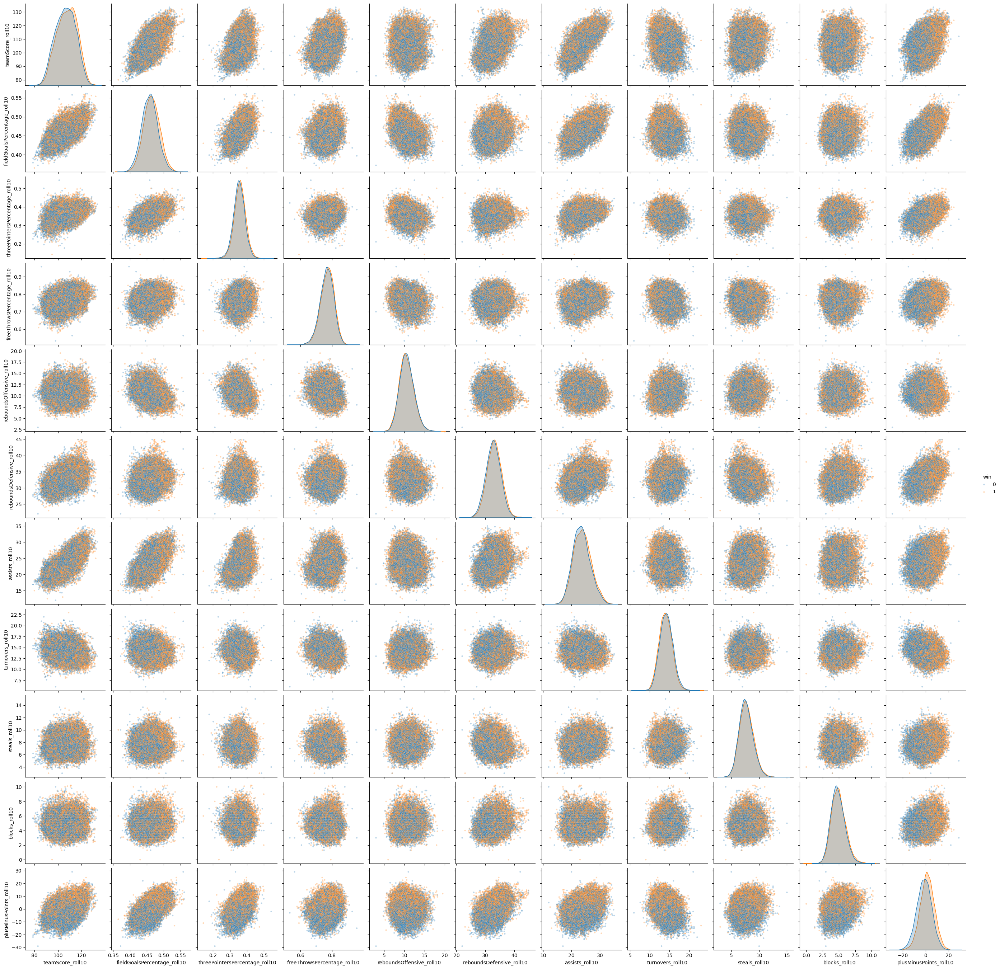

In [49]:
# plot of the rolling features: does not make a lot of sense, just to have a sense of the data
roll_feature_cols = [f'{col}_roll{window}' for col in roll_cols if col != 'win']

sns.pairplot(
    team_stats_recent_trim.dropna(subset=roll_feature_cols),
    vars=roll_feature_cols,
    hue='win',
    plot_kws={'alpha': 0.3, 's': 10}
)

In [ ]:
team_stats_recent_trim.to_csv(prefix  + 'processed/TeamStatisticsFrom2010RPRoll10.csv', index=False)

In [10]:
team_stats_recent_trim_ewm.to_csv(prefix  + 'processed/TeamStatisticsFrom2010RPEWM3.csv', index=False)

In [25]:
team_stats_recent_trim.columns

Index(['gameId', 'gameDate', 'season', 'teamId', 'teamName', 'opponentTeamId',
       'opponentTeamName', 'home', 'win', 'teamScore', 'opponentScore',
       'fieldGoalsPercentage', 'threePointersPercentage',
       'freeThrowsPercentage', 'reboundsOffensive', 'reboundsDefensive',
       'assists', 'turnovers', 'steals', 'blocks', 'plusMinusPoints',
       'rest_days', 'b2b', 'teamScore_roll10', 'fieldGoalsPercentage_roll10',
       'threePointersPercentage_roll10', 'freeThrowsPercentage_roll10',
       'reboundsOffensive_roll10', 'reboundsDefensive_roll10',
       'assists_roll10', 'turnovers_roll10', 'steals_roll10', 'blocks_roll10',
       'plusMinusPoints_roll10', 'win_roll10'],
      dtype='str')

In [26]:
roll_cols = [
    'teamScore_roll10', 'fieldGoalsPercentage_roll10',
    'threePointersPercentage_roll10', 'freeThrowsPercentage_roll10',
    'reboundsOffensive_roll10', 'reboundsDefensive_roll10',
    'assists_roll10', 'turnovers_roll10', 'steals_roll10',
    'blocks_roll10', 'plusMinusPoints_roll10', 'win_roll10'
]

In [11]:
team_stats_recent_trim_ewm.columns

Index(['gameId', 'gameDate', 'season', 'teamId', 'teamName', 'opponentTeamId',
       'opponentTeamName', 'home', 'win', 'teamScore', 'opponentScore',
       'fieldGoalsPercentage', 'threePointersPercentage',
       'freeThrowsPercentage', 'reboundsOffensive', 'reboundsDefensive',
       'assists', 'turnovers', 'steals', 'blocks', 'plusMinusPoints',
       'rest_days', 'b2b', 'teamScore_ewm3', 'fieldGoalsPercentage_ewm3',
       'threePointersPercentage_ewm3', 'freeThrowsPercentage_ewm3',
       'reboundsOffensive_ewm3', 'reboundsDefensive_ewm3', 'assists_ewm3',
       'turnovers_ewm3', 'steals_ewm3', 'blocks_ewm3', 'plusMinusPoints_ewm3',
       'win_ewm3'],
      dtype='str')

In [12]:
roll_cols

['teamScore',
 'fieldGoalsPercentage',
 'threePointersPercentage',
 'freeThrowsPercentage',
 'reboundsOffensive',
 'reboundsDefensive',
 'assists',
 'turnovers',
 'steals',
 'blocks',
 'plusMinusPoints',
 'win']

In [13]:
ewm_cols = [f'{col}_ewm{half_life}' for col in roll_cols]

In [30]:
# prepare for matchups: home teams (with the win column)
home = team_stats_recent_trim[team_stats_recent_trim['home'] == 1][
    ['gameId', 'gameDate', 'season', 'teamId', 'teamName', 'rest_days', 'b2b', 'win'] + roll_cols
].rename(columns={col: f'home_{col}' for col in ['teamId', 'teamName', 'rest_days', 'b2b'] + roll_cols})

home

,gameId,gameDate,season,home_teamId,home_teamName,home_rest_days,home_b2b,win,home_teamScore_roll10,home_fieldGoalsPercentage_roll10,home_threePointersPercentage_roll10,home_freeThrowsPercentage_roll10,home_reboundsOffensive_roll10,home_reboundsDefensive_roll10,home_assists_roll10,home_turnovers_roll10,home_steals_roll10,home_blocks_roll10,home_plusMinusPoints_roll10,home_win_roll10
2,21000031,2010-10-30,2010,1610612737,Hawks,0.0,1,1,111.500000,0.519500,0.426500,0.855000,9.500000,35.500000,22.000000,17.500000,5.000000,8.500000,9.000000,1.000000
4,21000054,2010-11-03,2010,1610612737,Hawks,0.0,1,1,105.500000,0.474750,0.352500,0.819250,11.500000,32.500000,22.250000,14.750000,5.250000,7.000000,8.500000,1.000000
6,21000090,2010-11-07,2010,1610612737,Hawks,1.0,0,0,104.833333,0.496500,0.307667,0.818500,9.500000,32.833333,23.500000,14.666667,4.833333,6.500000,8.833333,1.000000
8,21000108,2010-11-10,2010,1610612737,Hawks,1.0,0,0,104.000000,0.499375,0.307250,0.812125,9.875000,32.625000,23.500000,14.875000,5.125000,5.750000,5.625000,0.750000
9,21000121,2010-11-12,2010,1610612737,Hawks,1.0,0,0,102.555556,0.498667,0.315889,0.796000,9.555556,31.777778,23.555556,15.111111,4.888889,5.444444,3.111111,0.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41026,22501085,2026-03-29,2025,1610612766,Hornets,0.0,1,0,117.300000,0.463500,0.398300,0.796900,13.100000,33.300000,25.500000,14.100000,7.100000,4.000000,10.800000,0.700000
41028,22501114,2026-04-02,2025,1610612766,Hornets,1.0,0,1,118.700000,0.473400,0.386900,0.817100,12.500000,33.000000,25.700000,13.600000,6.700000,3.500000,13.400000,0.700000
41029,22501120,2026-04-03,2025,1610612766,Hornets,0.0,1,1,119.700000,0.479400,0.376100,0.809700,12.300000,33.800000,25.500000,13.200000,6.600000,3.800000,14.600000,0.700000
41032,22501171,2026-04-10,2025,1610612766,Hornets,2.0,0,0,118.200000,0.476200,0.378400,0.807700,13.400000,33.300000,26.300000,12.400000,6.000000,3.500000,13.400000,0.700000


In [14]:
# prepare for matchups: home teams (with the win column)
home_ewm = team_stats_recent_trim_ewm[team_stats_recent_trim_ewm['home'] == 1][
    ['gameId', 'gameDate', 'season', 'teamId', 'teamName', 'rest_days', 'b2b', 'win'] + ewm_cols
].rename(columns={col: f'home_{col}' for col in ['teamId', 'teamName', 'rest_days', 'b2b'] + ewm_cols})

home_ewm

,gameId,gameDate,season,home_teamId,home_teamName,home_rest_days,home_b2b,win,home_teamScore_ewm3,home_fieldGoalsPercentage_ewm3,home_threePointersPercentage_ewm3,home_freeThrowsPercentage_ewm3,home_reboundsOffensive_ewm3,home_reboundsDefensive_ewm3,home_assists_ewm3,home_turnovers_ewm3,home_steals_ewm3,home_blocks_ewm3,home_plusMinusPoints_ewm3,home_win_ewm3
2,21000031,2010-10-30,2010,1610612737,Hawks,0.0,1,1,110.637400,0.518867,0.418047,0.853160,9.557507,35.557507,22.230027,17.787533,4.769973,8.442493,8.309920,1.000000
4,21000054,2010-11-03,2010,1610612737,Hawks,0.0,1,1,103.839755,0.465052,0.333527,0.804531,12.011554,31.805874,22.642626,13.884003,5.323696,6.743082,8.402029,1.000000
6,21000090,2010-11-07,2010,1610612737,Hawks,1.0,0,0,104.211211,0.502200,0.276754,0.810172,8.940709,32.726851,24.355853,14.216300,4.727349,6.271628,8.972125,1.000000
8,21000108,2010-11-10,2010,1610612737,Hawks,1.0,0,0,102.388979,0.503030,0.289700,0.803640,9.744142,32.660186,23.702120,14.855888,5.286311,5.029041,3.274627,0.560789
9,21000121,2010-11-12,2010,1610612737,Hawks,1.0,0,0,99.703790,0.500665,0.312169,0.771424,9.097153,30.854137,23.772351,15.361407,4.747266,4.550652,-1.505539,0.428571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41026,22501085,2026-03-29,2025,1610612766,Hornets,0.0,1,0,119.581164,0.468798,0.394475,0.791226,13.980015,34.108976,25.506592,13.825198,6.690373,3.648957,13.326334,0.685988
41028,22501114,2026-04-02,2025,1610612766,Hornets,1.0,0,1,115.678712,0.463554,0.357727,0.817428,13.126151,32.922471,24.955592,12.779763,5.986247,3.287637,12.334248,0.638445
41029,22501120,2026-04-03,2025,1610612766,Hornets,0.0,1,1,118.014287,0.474374,0.359640,0.827654,12.687527,33.557363,25.377352,12.206300,6.195384,3.434597,13.915689,0.713033
41032,22501171,2026-04-10,2025,1610612766,Hornets,2.0,0,0,116.790878,0.468628,0.380059,0.827110,13.411322,31.733247,26.744580,12.204488,6.478794,3.573401,9.710081,0.650217


In [31]:
# prepare for matchups: away teams (without the win column)

away = team_stats_recent_trim[team_stats_recent_trim['home'] == 0][
    ['gameId', 'teamId', 'teamName', 'rest_days', 'b2b'] + roll_cols
].rename(columns={col: f'away_{col}' for col in ['teamId', 'teamName', 'rest_days', 'b2b'] + roll_cols})

away

,gameId,away_teamId,away_teamName,away_rest_days,away_b2b,away_teamScore_roll10,away_fieldGoalsPercentage_roll10,away_threePointersPercentage_roll10,away_freeThrowsPercentage_roll10,away_reboundsOffensive_roll10,away_reboundsDefensive_roll10,away_assists_roll10,away_turnovers_roll10,away_steals_roll10,away_blocks_roll10,away_plusMinusPoints_roll10,away_win_roll10
0,21000008,1610612737,Hawks,5.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,21000021,1610612737,Hawks,1.0,0,119.000000,0.525000,0.500000,0.8710,9.000000,35.000000,20.000000,15.000000,7.000000,9.000000,15.000000,1.000000
3,21000047,1610612737,Hawks,2.0,0,107.333333,0.486333,0.372000,0.8590,10.666667,33.666667,21.000000,17.333333,4.666667,7.000000,7.333333,1.000000
5,21000074,1610612737,Hawks,1.0,0,103.200000,0.487200,0.324800,0.8206,9.800000,32.400000,22.800000,14.600000,4.800000,6.200000,8.600000,1.000000
7,21000096,1610612737,Hawks,0.0,1,106.142857,0.503000,0.307143,0.8120,10.000000,32.000000,24.285714,14.571429,5.000000,6.142857,7.000000,0.857143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41027,22501100,1610612766,Hornets,1.0,0,117.300000,0.464900,0.392900,0.8091,12.800000,33.200000,25.000000,14.100000,7.200000,3.500000,10.500000,0.700000
41030,22501137,1610612766,Hornets,1.0,0,122.400000,0.489700,0.391800,0.8140,12.400000,34.600000,26.800000,13.200000,6.700000,3.500000,18.000000,0.800000
41031,22501149,1610612766,Hornets,1.0,0,121.000000,0.485500,0.393500,0.8197,13.000000,33.800000,26.700000,13.400000,6.400000,3.400000,16.400000,0.800000
41033,22501190,1610612766,Hornets,1.0,0,115.800000,0.461900,0.364200,0.8236,13.500000,32.400000,25.400000,12.200000,6.300000,3.900000,9.300000,0.600000


In [16]:
# prepare for matchups: away teams (without the win column)

away_ewm = team_stats_recent_trim_ewm[team_stats_recent_trim_ewm['home'] == 0][
    ['gameId', 'teamId', 'teamName', 'rest_days', 'b2b'] + ewm_cols
].rename(columns={col: f'away_{col}' for col in ['teamId', 'teamName', 'rest_days', 'b2b'] + ewm_cols})

away_ewm

,gameId,away_teamId,away_teamName,away_rest_days,away_b2b,away_teamScore_ewm3,away_fieldGoalsPercentage_ewm3,away_threePointersPercentage_ewm3,away_freeThrowsPercentage_ewm3,away_reboundsOffensive_ewm3,away_reboundsDefensive_ewm3,away_assists_ewm3,away_turnovers_ewm3,away_steals_ewm3,away_blocks_ewm3,away_plusMinusPoints_ewm3,away_win_ewm3
0,21000008,1610612737,Hawks,5.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,21000021,1610612737,Hawks,1.0,0,119.000000,0.525000,0.500000,0.871000,9.000000,35.000000,20.000000,15.000000,7.000000,9.000000,15.000000,1.000000
3,21000047,1610612737,Hawks,2.0,0,105.835821,0.478075,0.354074,0.858870,10.977876,33.264485,20.897321,17.462598,4.452283,6.609525,6.531652,1.000000
5,21000074,1610612737,Hawks,1.0,0,100.876430,0.486720,0.297530,0.810996,9.297648,31.864337,23.352569,13.918937,4.623896,5.615821,8.582113,1.000000
7,21000096,1610612737,Hawks,0.0,1,106.730529,0.512444,0.283767,0.800605,9.985440,31.252944,25.551106,14.160632,5.054888,5.686984,5.633519,0.742632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41027,22501100,1610612766,Hornets,1.0,0,115.335281,0.461619,0.370653,0.790767,13.158940,32.642398,24.164286,13.242361,5.722752,3.102479,7.482626,0.544469
41030,22501137,1610612766,Hornets,1.0,0,120.280634,0.475328,0.386533,0.835771,12.545691,34.061278,26.537301,11.544842,6.567675,4.170138,15.377178,0.772235
41031,22501149,1610612766,Hornets,1.0,0,120.635338,0.478149,0.393850,0.842214,13.258313,33.223438,27.457954,12.257639,6.863163,3.722440,15.093067,0.819222
41033,22501190,1610612766,Hornets,1.0,0,113.326929,0.451582,0.358798,0.826881,13.532766,30.756781,24.527979,12.781201,7.205217,4.486606,3.993506,0.516078


In [32]:
matchups = home.merge(away, on='gameId')

matchups

,gameId,gameDate,season,home_teamId,home_teamName,home_rest_days,home_b2b,win,home_teamScore_roll10,home_fieldGoalsPercentage_roll10,home_threePointersPercentage_roll10,home_freeThrowsPercentage_roll10,home_reboundsOffensive_roll10,home_reboundsDefensive_roll10,home_assists_roll10,home_turnovers_roll10,home_steals_roll10,home_blocks_roll10,home_plusMinusPoints_roll10,home_win_roll10,away_teamId,away_teamName,away_rest_days,away_b2b,away_teamScore_roll10,away_fieldGoalsPercentage_roll10,away_threePointersPercentage_roll10,away_freeThrowsPercentage_roll10,away_reboundsOffensive_roll10,away_reboundsDefensive_roll10,away_assists_roll10,away_turnovers_roll10,away_steals_roll10,away_blocks_roll10,away_plusMinusPoints_roll10,away_win_roll10
0,21000031,2010-10-30,2010,1610612737,Hawks,0.0,1,1,111.500000,0.519500,0.426500,0.855000,9.500000,35.500000,22.000000,17.500000,5.000000,8.500000,9.000000,1.000000,1610612764,Wizards,1.0,0,83.00,0.372000,0.211000,0.70000,3.000,22.000,17.000,13.000,10.000,3.00,-29.000,0.000
1,21000054,2010-11-03,2010,1610612737,Hawks,0.0,1,1,105.500000,0.474750,0.352500,0.819250,11.500000,32.500000,22.250000,14.750000,5.250000,7.000000,8.500000,1.000000,1610612765,Pistons,0.0,1,94.75,0.436000,0.397000,0.67975,12.000,28.500,16.000,14.750,4.500,4.75,-9.250,0.000
2,21000090,2010-11-07,2010,1610612737,Hawks,1.0,0,0,104.833333,0.496500,0.307667,0.818500,9.500000,32.833333,23.500000,14.666667,4.833333,6.500000,8.833333,1.000000,1610612756,Suns,1.0,0,108.20,0.458800,0.403000,0.74680,13.600,28.800,19.800,17.000,8.000,4.80,-0.600,0.400
3,21000108,2010-11-10,2010,1610612737,Hawks,1.0,0,0,104.000000,0.499375,0.307250,0.812125,9.875000,32.625000,23.500000,14.875000,5.125000,5.750000,5.625000,0.750000,1610612749,Bucks,0.0,1,91.75,0.414375,0.318250,0.74925,10.875,31.375,16.875,15.375,6.125,3.00,0.375,0.375
4,21000121,2010-11-12,2010,1610612737,Hawks,1.0,0,0,102.555556,0.498667,0.315889,0.796000,9.555556,31.777778,23.555556,15.111111,4.888889,5.444444,3.111111,0.666667,1610612762,Jazz,1.0,0,104.25,0.462625,0.357625,0.79300,10.375,31.375,24.375,16.000,7.250,4.75,0.875,0.625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20513,22501085,2026-03-29,2025,1610612766,Hornets,0.0,1,0,117.300000,0.463500,0.398300,0.796900,13.100000,33.300000,25.500000,14.100000,7.100000,4.000000,10.800000,0.700000,1610612738,Celtics,1.0,0,111.50,0.446600,0.349700,0.87800,11.900,35.800,24.100,12.400,6.100,2.80,5.200,0.700
20514,22501114,2026-04-02,2025,1610612766,Hornets,1.0,0,1,118.700000,0.473400,0.386900,0.817100,12.500000,33.000000,25.700000,13.600000,6.700000,3.500000,13.400000,0.700000,1610612756,Suns,1.0,0,115.50,0.452700,0.361100,0.72690,12.900,29.700,26.500,11.300,8.900,4.70,3.600,0.300
20515,22501120,2026-04-03,2025,1610612766,Hornets,0.0,1,1,119.700000,0.479400,0.376100,0.809700,12.300000,33.800000,25.500000,13.200000,6.600000,3.800000,14.600000,0.700000,1610612754,Pacers,1.0,0,121.40,0.519900,0.430100,0.81470,7.200,31.200,34.200,13.400,6.700,4.50,-3.900,0.300
20516,22501171,2026-04-10,2025,1610612766,Hornets,2.0,0,0,118.200000,0.476200,0.378400,0.807700,13.400000,33.300000,26.300000,12.400000,6.000000,3.500000,13.400000,0.700000,1610612765,Pistons,1.0,0,119.00,0.511600,0.418200,0.77960,11.300,31.800,32.100,14.900,9.500,6.50,9.000,0.700


In [17]:
matchups_ewm = home_ewm.merge(away_ewm, on='gameId')

matchups_ewm

,gameId,gameDate,season,home_teamId,home_teamName,home_rest_days,home_b2b,win,home_teamScore_ewm3,home_fieldGoalsPercentage_ewm3,home_threePointersPercentage_ewm3,home_freeThrowsPercentage_ewm3,home_reboundsOffensive_ewm3,home_reboundsDefensive_ewm3,home_assists_ewm3,home_turnovers_ewm3,home_steals_ewm3,home_blocks_ewm3,home_plusMinusPoints_ewm3,home_win_ewm3,away_teamId,away_teamName,away_rest_days,away_b2b,away_teamScore_ewm3,away_fieldGoalsPercentage_ewm3,away_threePointersPercentage_ewm3,away_freeThrowsPercentage_ewm3,away_reboundsOffensive_ewm3,away_reboundsDefensive_ewm3,away_assists_ewm3,away_turnovers_ewm3,away_steals_ewm3,away_blocks_ewm3,away_plusMinusPoints_ewm3,away_win_ewm3
0,21000031,2010-10-30,2010,1610612737,Hawks,0.0,1,1,110.637400,0.518867,0.418047,0.853160,9.557507,35.557507,22.230027,17.787533,4.769973,8.442493,8.309920,1.000000,1610612764,Wizards,1.0,0,83.000000,0.372000,0.211000,0.700000,3.000000,22.000000,17.000000,13.000000,10.000000,3.000000,-29.000000,0.000000
1,21000054,2010-11-03,2010,1610612737,Hawks,0.0,1,1,103.839755,0.465052,0.333527,0.804531,12.011554,31.805874,22.642626,13.884003,5.323696,6.743082,8.402029,1.000000,1610612765,Pistons,0.0,1,93.288051,0.433953,0.367119,0.689186,11.962335,28.572844,15.286032,15.605742,4.268472,4.605742,-11.310123,0.000000
2,21000090,2010-11-07,2010,1610612737,Hawks,1.0,0,0,104.211211,0.502200,0.276754,0.810172,8.940709,32.726851,24.355853,14.216300,4.727349,6.271628,8.972125,1.000000,1610612756,Suns,1.0,0,111.004921,0.452440,0.397301,0.753193,15.068970,29.424729,20.495619,17.966470,8.840114,4.683926,0.246050,0.451738
3,21000108,2010-11-10,2010,1610612737,Hawks,1.0,0,0,102.388979,0.503030,0.289700,0.803640,9.744142,32.660186,23.702120,14.855888,5.286311,5.029041,3.274627,0.560789,1610612749,Bucks,0.0,1,93.498823,0.425335,0.318156,0.748566,11.144407,31.666456,17.063144,15.370298,7.004357,2.832838,4.238049,0.476244
4,21000121,2010-11-12,2010,1610612737,Hawks,1.0,0,0,99.703790,0.500665,0.312169,0.771424,9.097153,30.854137,23.772351,15.361407,4.747266,4.550652,-1.505539,0.428571,1610612762,Jazz,1.0,0,105.805362,0.469206,0.363783,0.814978,9.948000,30.971238,24.716956,14.922372,7.074698,4.702414,3.512072,0.767766
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20513,22501085,2026-03-29,2025,1610612766,Hornets,0.0,1,0,119.581164,0.468798,0.394475,0.791226,13.980015,34.108976,25.506592,13.825198,6.690373,3.648957,13.326334,0.685988,1610612738,Celtics,1.0,0,110.987628,0.447983,0.357648,0.858341,12.297193,36.953412,23.923522,12.906001,5.344414,3.376510,5.933385,0.770700
20514,22501114,2026-04-02,2025,1610612766,Hornets,1.0,0,1,115.678712,0.463554,0.357727,0.817428,13.126151,32.922471,24.955592,12.779763,5.986247,3.287637,12.334248,0.638445,1610612756,Suns,1.0,0,118.440544,0.456581,0.355135,0.710876,14.098994,30.338903,27.554131,12.337554,9.263327,4.690056,7.695422,0.452890
20515,22501120,2026-04-03,2025,1610612766,Hornets,0.0,1,1,118.014287,0.474374,0.359640,0.827654,12.687527,33.557363,25.377352,12.206300,6.195384,3.434597,13.915689,0.713033,1610612754,Pacers,1.0,0,126.356195,0.530782,0.424346,0.825864,7.240686,31.908304,36.459936,13.563718,7.408062,4.350041,1.609918,0.455930
20516,22501171,2026-04-10,2025,1610612766,Hornets,2.0,0,0,116.790878,0.468628,0.380059,0.827110,13.411322,31.733247,26.744580,12.204488,6.478794,3.573401,9.710081,0.650217,1610612765,Pistons,1.0,0,119.862002,0.516683,0.412224,0.778587,11.876143,31.226062,32.670091,14.435007,9.686112,6.926274,10.065814,0.715530


In [33]:
matchups.columns

Index(['gameId', 'gameDate', 'season', 'home_teamId', 'home_teamName',
       'home_rest_days', 'home_b2b', 'win', 'home_teamScore_roll10',
       'home_fieldGoalsPercentage_roll10',
       'home_threePointersPercentage_roll10',
       'home_freeThrowsPercentage_roll10', 'home_reboundsOffensive_roll10',
       'home_reboundsDefensive_roll10', 'home_assists_roll10',
       'home_turnovers_roll10', 'home_steals_roll10', 'home_blocks_roll10',
       'home_plusMinusPoints_roll10', 'home_win_roll10', 'away_teamId',
       'away_teamName', 'away_rest_days', 'away_b2b', 'away_teamScore_roll10',
       'away_fieldGoalsPercentage_roll10',
       'away_threePointersPercentage_roll10',
       'away_freeThrowsPercentage_roll10', 'away_reboundsOffensive_roll10',
       'away_reboundsDefensive_roll10', 'away_assists_roll10',
       'away_turnovers_roll10', 'away_steals_roll10', 'away_blocks_roll10',
       'away_plusMinusPoints_roll10', 'away_win_roll10'],
      dtype='str')

In [38]:
# find the difference of rolling averages and the rest_days, back-2-backs between home teams and visiting teams, which are more revelant to win/loss 
diff_cols = []
for col in roll_cols + ['rest_days', 'b2b']:
    diff_name = f'{col}_diff'
    matchups[diff_name] = matchups[f'home_{col}'] - matchups[f'away_{col}']
    diff_cols.append(diff_name)

In [18]:
ewm_cols

['teamScore_ewm3',
 'fieldGoalsPercentage_ewm3',
 'threePointersPercentage_ewm3',
 'freeThrowsPercentage_ewm3',
 'reboundsOffensive_ewm3',
 'reboundsDefensive_ewm3',
 'assists_ewm3',
 'turnovers_ewm3',
 'steals_ewm3',
 'blocks_ewm3',
 'plusMinusPoints_ewm3',
 'win_ewm3']

In [19]:
# find the difference of ewm and the rest_days, back-2-backs between home teams and visiting teams, which are more revelant to win/loss 
diff_cols_ewm = []
for col in ewm_cols + ['rest_days', 'b2b']:
    diff_name = f'{col}_diff'
    matchups_ewm[diff_name] = matchups_ewm[f'home_{col}'] - matchups_ewm[f'away_{col}']
    diff_cols_ewm.append(diff_name)

In [39]:
diff_cols

['teamScore_roll10_diff',
 'fieldGoalsPercentage_roll10_diff',
 'threePointersPercentage_roll10_diff',
 'freeThrowsPercentage_roll10_diff',
 'reboundsOffensive_roll10_diff',
 'reboundsDefensive_roll10_diff',
 'assists_roll10_diff',
 'turnovers_roll10_diff',
 'steals_roll10_diff',
 'blocks_roll10_diff',
 'plusMinusPoints_roll10_diff',
 'win_roll10_diff',
 'rest_days_diff',
 'b2b_diff']

In [20]:
diff_cols_ewm

['teamScore_ewm3_diff',
 'fieldGoalsPercentage_ewm3_diff',
 'threePointersPercentage_ewm3_diff',
 'freeThrowsPercentage_ewm3_diff',
 'reboundsOffensive_ewm3_diff',
 'reboundsDefensive_ewm3_diff',
 'assists_ewm3_diff',
 'turnovers_ewm3_diff',
 'steals_ewm3_diff',
 'blocks_ewm3_diff',
 'plusMinusPoints_ewm3_diff',
 'win_ewm3_diff',
 'rest_days_diff',
 'b2b_diff']

In [40]:
matchups.columns

Index(['gameId', 'gameDate', 'season', 'home_teamId', 'home_teamName',
       'home_rest_days', 'home_b2b', 'win', 'home_teamScore_roll10',
       'home_fieldGoalsPercentage_roll10',
       'home_threePointersPercentage_roll10',
       'home_freeThrowsPercentage_roll10', 'home_reboundsOffensive_roll10',
       'home_reboundsDefensive_roll10', 'home_assists_roll10',
       'home_turnovers_roll10', 'home_steals_roll10', 'home_blocks_roll10',
       'home_plusMinusPoints_roll10', 'home_win_roll10', 'away_teamId',
       'away_teamName', 'away_rest_days', 'away_b2b', 'away_teamScore_roll10',
       'away_fieldGoalsPercentage_roll10',
       'away_threePointersPercentage_roll10',
       'away_freeThrowsPercentage_roll10', 'away_reboundsOffensive_roll10',
       'away_reboundsDefensive_roll10', 'away_assists_roll10',
       'away_turnovers_roll10', 'away_steals_roll10', 'away_blocks_roll10',
       'away_plusMinusPoints_roll10', 'away_win_roll10',
       'teamScore_roll10_diff', 'fieldGoalsP

In [21]:
matchups_ewm.columns

Index(['gameId', 'gameDate', 'season', 'home_teamId', 'home_teamName',
       'home_rest_days', 'home_b2b', 'win', 'home_teamScore_ewm3',
       'home_fieldGoalsPercentage_ewm3', 'home_threePointersPercentage_ewm3',
       'home_freeThrowsPercentage_ewm3', 'home_reboundsOffensive_ewm3',
       'home_reboundsDefensive_ewm3', 'home_assists_ewm3',
       'home_turnovers_ewm3', 'home_steals_ewm3', 'home_blocks_ewm3',
       'home_plusMinusPoints_ewm3', 'home_win_ewm3', 'away_teamId',
       'away_teamName', 'away_rest_days', 'away_b2b', 'away_teamScore_ewm3',
       'away_fieldGoalsPercentage_ewm3', 'away_threePointersPercentage_ewm3',
       'away_freeThrowsPercentage_ewm3', 'away_reboundsOffensive_ewm3',
       'away_reboundsDefensive_ewm3', 'away_assists_ewm3',
       'away_turnovers_ewm3', 'away_steals_ewm3', 'away_blocks_ewm3',
       'away_plusMinusPoints_ewm3', 'away_win_ewm3', 'teamScore_ewm3_diff',
       'fieldGoalsPercentage_ewm3_diff', 'threePointersPercentage_ewm3_diff',
     

In [ ]:
# drop off the early season games from 2010 when the rolling is not available
# prediction is available when the data is available for both teams 


matchup_clean = matchups.dropna(subset=diff_cols)

matchup_clean.to_csv(prefix  + 'processed/TeamStatisticsFrom2010RPMatchups.csv', index=False)

In [23]:

matchup_ewm_clean = matchups_ewm.dropna(subset=diff_cols_ewm)

matchup_ewm_clean.to_csv(prefix  + 'processed/TeamStatisticsFrom2010RPEWMMatchups.csv', index=False)

In [ ]:
sns.pairplot(
    matchup_clean,
    vars=diff_cols,
    hue='win',
    plot_kws={'alpha': 0.3, 's': 10}
)

In [62]:
team_stats_regular = team_stats_recent[
    (team_stats_recent['gameDate'] >= team_stats_recent['season_start']) &
    (team_stats_recent['gameDate'] <= team_stats_recent['season_end'])
]

team_stats_regular

,gameId,gameDateTimeEst,gameType,gameLabel,gameSubLabel,seriesGameNumber,teamId,teamCity,teamName,opponentTeamId,...,opponentFreeThrowAttemptRate,opponentTurnoverPercentage,opponentOffensiveReboundPercentage,gameDate,season,season_year,season_start,season_end,playoffs_start,playoffs_end
182,22501193,2026-04-12 20:30:00,Regular Season,NaN,NaN,NaN,1610612741,Chicago,Bulls,1610612742,...,0.270,0.162,0.365,2026-04-12,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
183,22501193,2026-04-12 20:30:00,Regular Season,NaN,NaN,NaN,1610612742,Dallas,Mavericks,1610612741,...,0.179,0.116,0.288,2026-04-12,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
184,22501194,2026-04-12 20:30:00,Regular Season,NaN,NaN,NaN,1610612763,Memphis,Grizzlies,1610612745,...,0.286,0.107,0.452,2026-04-12,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
185,22501194,2026-04-12 20:30:00,Regular Season,NaN,NaN,NaN,1610612745,Houston,Rockets,1610612763,...,0.105,0.126,0.179,2026-04-12,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
186,22501195,2026-04-12 20:30:00,Regular Season,NaN,NaN,NaN,1610612750,Minnesota,Timberwolves,1610612740,...,0.355,0.084,0.394,2026-04-12,2025,2025,2025-10-21,2026-04-12,2026-04-18,2026-06-19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43319,21000003,2010-10-26 22:30:00,Regular Season,NaN,NaN,NaN,1610612745,Houston,Rockets,1610612747,...,0.292,0.115,0.305,2010-10-26,2010,2010,2010-10-26,2011-04-13,2011-04-16,2011-06-12
43320,21000002,2010-10-26 22:00:00,Regular Season,NaN,NaN,NaN,1610612756,Phoenix,Suns,1610612757,...,0.161,0.167,0.490,2010-10-26,2010,2010,2010-10-26,2011-04-13,2011-04-16,2011-06-12
43321,21000002,2010-10-26 22:00:00,Regular Season,NaN,NaN,NaN,1610612757,Portland,Trail Blazers,1610612756,...,0.216,0.211,0.244,2010-10-26,2010,2010,2010-10-26,2011-04-13,2011-04-16,2011-06-12
43322,21000001,2010-10-26 19:30:00,Regular Season,NaN,NaN,NaN,1610612748,Miami,Heat,1610612738,...,0.362,0.217,0.268,2010-10-26,2010,2010,2010-10-26,2011-04-13,2011-04-16,2011-06-12


In [63]:
team_stats_regular_trim = team_stats_regular[keep_cols].copy()

In [64]:
team_stats_regular_trim = team_stats_regular_trim.sort_values(['teamId', 'gameDate']).reset_index(drop=True)

In [65]:
team_stats_regular_trim

,gameId,gameDate,season,teamId,teamName,opponentTeamId,opponentTeamName,home,win,teamScore,...,fieldGoalsPercentage,threePointersPercentage,freeThrowsPercentage,reboundsOffensive,reboundsDefensive,assists,turnovers,steals,blocks,plusMinusPoints
0,21000008,2010-10-27,2010,1610612737,Hawks,1610612763,Grizzlies,0,1,119,...,0.525,0.500,0.871,9,35,20,15,7,9,15.0
1,21000021,2010-10-29,2010,1610612737,Hawks,1610612755,76ers,0,1,104,...,0.514,0.353,0.839,10,36,24,20,3,8,3.0
2,21000031,2010-10-30,2010,1610612737,Hawks,1610612764,Wizards,1,1,99,...,0.420,0.263,0.867,13,30,19,17,4,4,4.0
3,21000047,2010-11-02,2010,1610612737,Hawks,1610612739,Cavaliers,0,1,100,...,0.440,0.294,0.700,14,29,26,7,7,7,12.0
4,21000054,2010-11-03,2010,1610612737,Hawks,1610612765,Pistons,1,1,94,...,0.537,0.214,0.826,3,32,25,14,3,3,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38289,22501120,2026-04-03,2025,1610612766,Hornets,1610612754,Pacers,1,1,129,...,0.479,0.490,0.867,12,36,31,9,8,7,21.0
38290,22501137,2026-04-05,2025,1610612766,Hornets,1610612750,Timberwolves,0,1,122,...,0.489,0.422,0.867,16,30,31,15,8,2,14.0
38291,22501149,2026-04-07,2025,1610612766,Hornets,1610612738,Celtics,0,0,102,...,0.432,0.327,0.769,14,26,24,12,5,3,-11.0
38292,22501171,2026-04-10,2025,1610612766,Hornets,1610612765,Pistons,1,0,100,...,0.386,0.277,0.826,14,27,16,15,10,8,-18.0


In [ ]:
team_stats_regular_trim.to_csv(prefix  + 'processed/TeamStatisticsFrom2010Reg.csv', index=False)

In [71]:
# Select the features for rolling average. Check these rows for anormaly 
roll_cols = [
    'teamScore', 'fieldGoalsPercentage', 'threePointersPercentage',
    'freeThrowsPercentage', 'reboundsOffensive', 'reboundsDefensive',
    'assists', 'turnovers', 'steals', 'blocks', 'plusMinusPoints', 'win',
]

# Compute the rolling average for the past 10 games
window = 10

for col in roll_cols:
    team_stats_regular_trim[f'{col}_roll{window}'] = (
        team_stats_regular_trim.groupby('teamId')[col]
        .transform(lambda x: x.shift(1).rolling(window=window, min_periods=1).mean())
    )

In [77]:
team_stats_regular_trim

,gameId,gameDate,season,teamId,teamName,opponentTeamId,opponentTeamName,home,win,teamScore,...,threePointersPercentage_roll10,freeThrowsPercentage_roll10,reboundsOffensive_roll10,reboundsDefensive_roll10,assists_roll10,turnovers_roll10,steals_roll10,blocks_roll10,plusMinusPoints_roll10,win_roll10
0,21000008,2010-10-27,2010,1610612737,Hawks,1610612763,Grizzlies,0,1,119,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,21000021,2010-10-29,2010,1610612737,Hawks,1610612755,76ers,0,1,104,...,0.5000,0.87100,9.000000,35.000000,20.00,15.000000,7.000000,9.0,15.000000,1.0
2,21000031,2010-10-30,2010,1610612737,Hawks,1610612764,Wizards,1,1,99,...,0.4265,0.85500,9.500000,35.500000,22.00,17.500000,5.000000,8.5,9.000000,1.0
3,21000047,2010-11-02,2010,1610612737,Hawks,1610612739,Cavaliers,0,1,100,...,0.3720,0.85900,10.666667,33.666667,21.00,17.333333,4.666667,7.0,7.333333,1.0
4,21000054,2010-11-03,2010,1610612737,Hawks,1610612765,Pistons,1,1,94,...,0.3525,0.81925,11.500000,32.500000,22.25,14.750000,5.250000,7.0,8.500000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38289,22501120,2026-04-03,2025,1610612766,Hornets,1610612754,Pacers,1,1,129,...,0.3761,0.80970,12.300000,33.800000,25.50,13.200000,6.600000,3.8,14.600000,0.7
38290,22501137,2026-04-05,2025,1610612766,Hornets,1610612750,Timberwolves,0,1,122,...,0.3918,0.81400,12.400000,34.600000,26.80,13.200000,6.700000,3.5,18.000000,0.8
38291,22501149,2026-04-07,2025,1610612766,Hornets,1610612738,Celtics,0,0,102,...,0.3935,0.81970,13.000000,33.800000,26.70,13.400000,6.400000,3.4,16.400000,0.8
38292,22501171,2026-04-10,2025,1610612766,Hornets,1610612765,Pistons,1,0,100,...,0.3784,0.80770,13.400000,33.300000,26.30,12.400000,6.000000,3.5,13.400000,0.7


In [ ]:
team_stats_regular_trim.to_csv(prefix  + 'processed/TeamStatisticsFrom2010RegRoll10.csv', index=False)

In [80]:
roll_cols = [
    'teamScore_roll10', 'fieldGoalsPercentage_roll10',
    'threePointersPercentage_roll10', 'freeThrowsPercentage_roll10',
    'reboundsOffensive_roll10', 'reboundsDefensive_roll10',
    'assists_roll10', 'turnovers_roll10', 'steals_roll10',
    'blocks_roll10', 'plusMinusPoints_roll10', 'win_roll10'
]

In [81]:
homeR = team_stats_regular_trim[team_stats_regular_trim['home'] == 1][
    ['gameId', 'gameDate', 'season', 'teamId', 'teamName', 'win'] + roll_cols
].rename(columns={col: f'home_{col}' for col in roll_cols})

awayR = team_stats_regular_trim[team_stats_regular_trim['home'] == 0][
    ['gameId', 'teamId', 'teamName'] + roll_cols
].rename(columns={col: f'away_{col}' for col in roll_cols})

matchupsR = homeR.merge(awayR, on='gameId', suffixes=('_home', '_away'))

matchupsR

,gameId,gameDate,season,teamId_home,teamName_home,win,home_teamScore_roll10,home_fieldGoalsPercentage_roll10,home_threePointersPercentage_roll10,home_freeThrowsPercentage_roll10,...,away_threePointersPercentage_roll10,away_freeThrowsPercentage_roll10,away_reboundsOffensive_roll10,away_reboundsDefensive_roll10,away_assists_roll10,away_turnovers_roll10,away_steals_roll10,away_blocks_roll10,away_plusMinusPoints_roll10,away_win_roll10
0,21000031,2010-10-30,2010,1610612737,Hawks,1,111.500000,0.519500,0.426500,0.855000,...,0.211000,0.70000,3.000,22.000,17.000,13.000,10.000,3.00,-29.000,0.000
1,21000054,2010-11-03,2010,1610612737,Hawks,1,105.500000,0.474750,0.352500,0.819250,...,0.397000,0.67975,12.000,28.500,16.000,14.750,4.500,4.75,-9.250,0.000
2,21000090,2010-11-07,2010,1610612737,Hawks,0,104.833333,0.496500,0.307667,0.818500,...,0.403000,0.74680,13.600,28.800,19.800,17.000,8.000,4.80,-0.600,0.400
3,21000108,2010-11-10,2010,1610612737,Hawks,0,104.000000,0.499375,0.307250,0.812125,...,0.318250,0.74925,10.875,31.375,16.875,15.375,6.125,3.00,0.375,0.375
4,21000121,2010-11-12,2010,1610612737,Hawks,0,102.555556,0.498667,0.315889,0.796000,...,0.357625,0.79300,10.375,31.375,24.375,16.000,7.250,4.75,0.875,0.625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19142,22501077,2026-03-28,2025,1610612766,Hornets,0,117.900000,0.468700,0.403900,0.813800,...,0.302500,0.77090,11.900,33.200,25.800,12.700,9.200,6.90,-1.000,0.600
19143,22501085,2026-03-29,2025,1610612766,Hornets,0,117.300000,0.463500,0.398300,0.796900,...,0.349700,0.87800,11.900,35.800,24.100,12.400,6.100,2.80,5.200,0.700
19144,22501114,2026-04-02,2025,1610612766,Hornets,1,118.700000,0.473400,0.386900,0.817100,...,0.361100,0.72690,12.900,29.700,26.500,11.300,8.900,4.70,3.600,0.300
19145,22501120,2026-04-03,2025,1610612766,Hornets,1,119.700000,0.479400,0.376100,0.809700,...,0.430100,0.81470,7.200,31.200,34.200,13.400,6.700,4.50,-3.900,0.300


In [83]:
roll_cols

['teamScore_roll10',
 'fieldGoalsPercentage_roll10',
 'threePointersPercentage_roll10',
 'freeThrowsPercentage_roll10',
 'reboundsOffensive_roll10',
 'reboundsDefensive_roll10',
 'assists_roll10',
 'turnovers_roll10',
 'steals_roll10',
 'blocks_roll10',
 'plusMinusPoints_roll10',
 'win_roll10']

In [82]:
# find the difference of rolling average between home teams and visiting teams, which are more revelant to win/loss 
diff_cols = []
for col in roll_cols:
    diff_name = f'{col}_diff'
    matchupsR[diff_name] = matchupsR[f'home_{col}'] - matchupsR[f'away_{col}']
    diff_cols.append(diff_name)

In [ ]:
matchupR_clean = matchupsR.dropna(subset=diff_cols)

matchupR_clean.to_csv(prefix  + 'processed/TeamStatisticsFrom2010RegMatchups.csv', index=False)

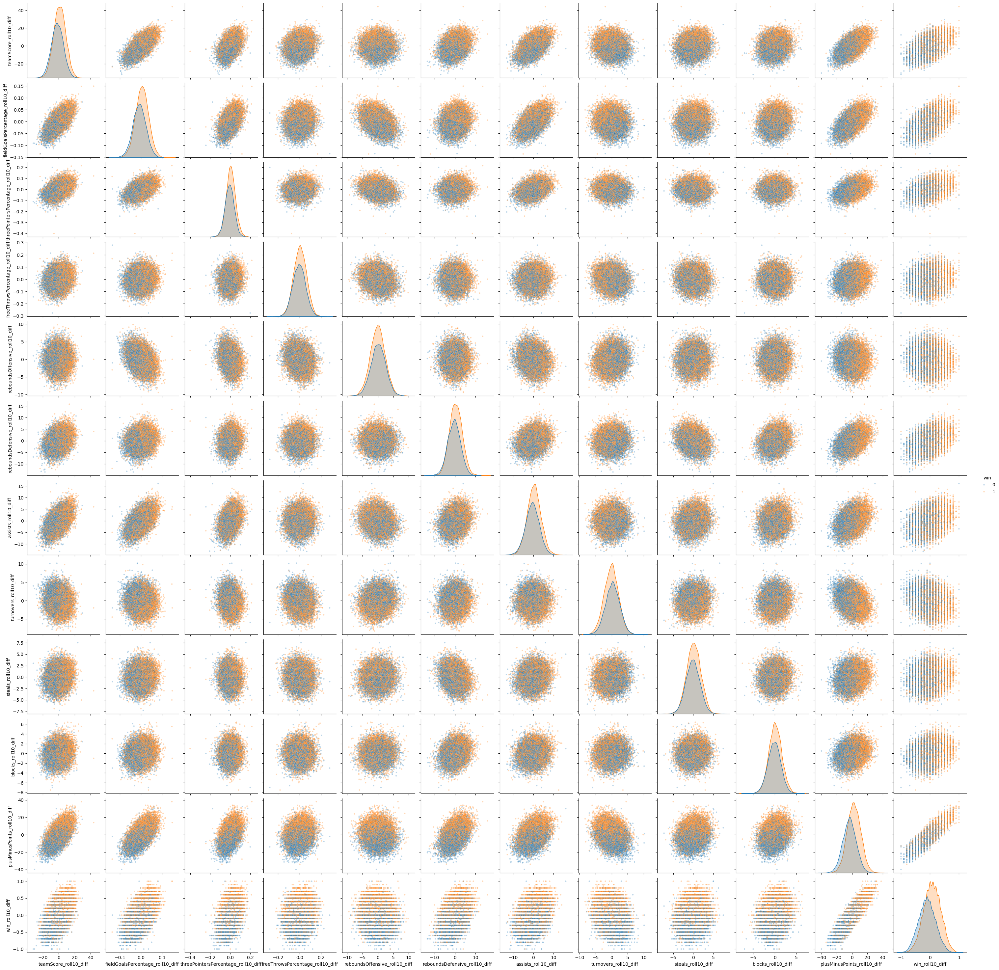

In [85]:
sns.pairplot(
    matchupR_clean,
    vars=diff_cols,
    hue='win',
    plot_kws={'alpha': 0.3, 's': 10}
)